<a href="https://colab.research.google.com/github/notkshitijsingh/vangogh-image-colorizer/blob/main/VanGogh_Image_Colorization_v3_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# VanGogh Image Colorization v3
## Papers Referred:
1. [Image-to-Image Translation with Conditional Adversarial Networks](https://arxiv.org/abs/1611.07004)
2. [Let there be Color!: Joint End-to-end Learning of Global and Local Image Priors for Automatic Image Colorization with Simultaneous Classification](http://iizuka.cs.tsukuba.ac.jp/projects/colorization/en/)
3. [Colorful Image Colorization](http://richzhang.github.io/colorization/)



## The Colorization Problem
This was the topic we chose for our project because this is a concept that has been around for a while, but was very tedious and required a lot of human input in the past, but is a rather simpler job with Machine Learning today. We tried using a huge dataset to train our model here (The COCO dataset from 2017) so that we can have as accurate results as practically possible.

## The L* a* b* over RGB approach
The default way the colors in our images are stored is in a RGB format, where each pixel has a numeric value for 3 channels- The Red Channel (R), The Green Channel (G) and The Blue Channel (B). The most obvious approach to the problem would be to have our agent get trained to predict the numeric values of these three channels. Why it gets tedious though is three channels means prediction of a **Rank 3 array**, which makes the training process a lot more hit-and-trial and longer than it should be. This is where the L* a* b* colour space comes in. This too uses three channels, however, it's not the same case as RGB because here, the L* channel stands for the lightness channel, which just gives us the greyscale image of the original, and that already is our input! Now, all we need to do is predict the values for the a* and b* channels, which is a **Rank 2 array**. Here is an image to show what the difference in these color spaces is:

<br>

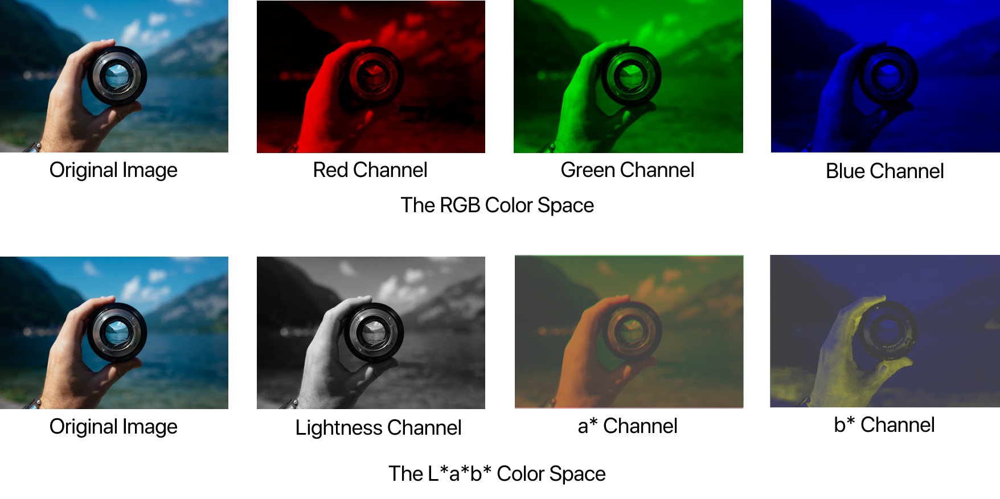

As you can see, since one of the channels is already our input, we have to make far less calculations and predictions using L* a* b* images. To be precise, RBG Values can have 256<sup>3</sup> choices, which goes more than *16 million choices*, where as **with L* a* b* images, that number goes down to around 65,000 which makes it a lot more efficient.**

## 1 - Our Baseline

### 1.1 - Loading Image Paths

Mounting Google Drive to Save Models

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


We'll first get ourselves the COCO 2017 dataset.

We will run this only once per GDrive

In [ ]:
# downloading the dataset zip
!wget http://images.cocodataset.org/zips/train2017.zip
# extracting the dataset zip
!unzip train2017.zip -d /content/drive/MyDrive/vanGoghDataset/
# deleting the zip
!rm train2017.zip

Now we'll get the training and validation sets

In [ ]:
import os
import glob
import time
import numpy as np
from PIL import Image
from pathlib import Path
from tqdm.notebook import tqdm
import matplotlib.pyplot as plt
from skimage.color import rgb2lab, lab2rgb

import torch
from torch import nn, optim
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

paths = glob.glob("/content/drive/MyDrive/vanGoghDataset/train2017/*.jpg") # all images in the dir
np.random.seed(123) # seeding for reproducable results
paths_subset = np.random.choice(paths, 10_000, replace=False) # randomly choosing 10,000 images
rand_idxs = np.random.permutation(10_000) # shuffling indexes
train_idxs = rand_idxs[:8000] # first 8000 images used to train
val_idxs = rand_idxs[8000:] # last 2000 images used to validate
train_paths = paths_subset[train_idxs]
val_paths = paths_subset[val_idxs]

print(len(train_paths), len(val_paths))

8000 2000


Our dataset for training here contains hundereds of thousands of images from the COCO 2017 dataset, but we'll be using 10,000 randomly for our training where 8,000 will be classified into the training set and the other 2,000 will be used to validate.

### 1.2 - Making Datasets and DataLoaders

In [ ]:
SIZE = 256

class ColorizationDataset(Dataset):
    def __init__(self, paths, split='train'):
        if split == 'train':
            self.transforms = transforms.Compose([
                transforms.Resize((SIZE, SIZE),  Image.BICUBIC),
                transforms.RandomHorizontalFlip(), # A little data augmentation!
            ])

        elif split == 'val':
            self.transforms = transforms.Resize((SIZE, SIZE), Image.BICUBIC)
        
        self.split = split
        self.size = SIZE
        self.paths = paths
    
    def __getitem__(self, idx):
        img = Image.open(self.paths[idx]).convert("RGB")
        img = self.transforms(img)
        img = np.array(img)
        img_lab = rgb2lab(img).astype("float32") # Converting RGB to L*a*b
        img_lab = transforms.ToTensor()(img_lab)
        L = img_lab[[0], ...] / 50. - 1. # Between -1 and 1
        ab = img_lab[[1, 2], ...] / 110. # Between -1 and 1
        
        return {'L': L, 'ab': ab}
    
    def __len__(self):
        return len(self.paths)

def make_dataloaders(batch_size=16, n_workers=4, pin_memory=True, **kwargs): # A handy function to make our dataloaders
    dataset = ColorizationDataset(**kwargs)
    dataloader = DataLoader(dataset, batch_size=batch_size, num_workers=n_workers,
                            pin_memory=pin_memory)
    return dataloader

train_dl = make_dataloaders(paths=train_paths, split='train')
val_dl = make_dataloaders(paths=val_paths, split='val')

data = next(iter(train_dl))
Ls, abs_ = data['L'], data['ab']

print(Ls.shape, abs_.shape)
print(len(train_dl), len(val_dl))

/usr/local/lib/python3.7/dist-packages/torchvision/transforms/transforms.py:333: UserWarning: Argument 'interpolation' of type int is deprecated since 0.13 and will be removed in 0.15. Please use InterpolationMode enum.
  "Argument 'interpolation' of type int is deprecated since 0.13 and will be removed in 0.15. "
/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:560: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


torch.Size([16, 1, 256, 256]) torch.Size([16, 2, 256, 256])
500 125


The code here itself is pretty self explainatory, this is just some processing that we are doing to have the input from the image in the way we would like to process it; basic stuff like flipping and chaning color spaces.

### 1.3 - Generator proposed by the papers

In [ ]:
class UnetBlock(nn.Module):
    def __init__(self, nf, ni, submodule=None, input_c=None, dropout=False, innermost=False, outermost=False):
        super().__init__()
        self.outermost = outermost
        if input_c is None: input_c = nf

        downconv = nn.Conv2d(input_c, ni, kernel_size=4, stride=2, padding=1, bias=False)
        downrelu = nn.LeakyReLU(0.2, True)
        downnorm = nn.BatchNorm2d(ni)
        uprelu = nn.ReLU(True)
        upnorm = nn.BatchNorm2d(nf)

        if outermost:
            upconv = nn.ConvTranspose2d(ni*2, nf, kernel_size=4, stride=2, padding=1)
            down = [downconv]
            up = [uprelu, upconv, nn.Tanh()]
            model = down + [submodule] + up
        
        elif innermost:
            upconv = nn.ConvTranspose2d(ni, nf, kernel_size=4, stride=2, padding=1, bias=False)
            down = [downrelu, downconv]
            up = [uprelu, upconv, upnorm]
            if dropout: up += [nn.Dropout(0.5)]
            model = down + up

        else:
            upconv = nn.ConvTranspose2d(ni*2, nf, kernel_size=4, stride=2, padding=1, bias=False)
            down = [downrelu, downconv, downnorm]
            up = [uprelu, upconv, upnorm]
            if dropout: up += [nn.Dropout(0.5)]
            model = down + [submodule] + up
        
        self.model = nn.Sequential(*model)

    def forward(self, x):
        if self.outermost:
            return self.model(x)
        else:
            return torch.cat([x, self.model(x)], 1)
        
class Unet(nn.Module):
    def __init__(self, input_c=1, output_c=2, n_down=8, num_filters=64):
        super().__init__()
        unet_block = UnetBlock(num_filters * 8, num_filters * 8, innermost=True)
        for _ in range(n_down - 5):
            unet_block = UnetBlock(num_filters * 8, num_filters * 8, submodule=unet_block, dropout=True)
        out_filters = num_filters * 8
        for _ in range(3):
            unet_block = UnetBlock(out_filters // 2, out_filters, submodule=unet_block)
            out_filters //= 2
        self.model = UnetBlock(output_c, out_filters, input_c=input_c, submodule=unet_block, outermost=True)
    
    def forward(self, x):
        return self.model(x)

#### U-Net Architecture
This is a rather hard to explain part but I will try my best. This generator was proposed in one of the research papers that I have mentioned. It uses a **U-Net as the generator** of our GAN. Our older Generator used to use **CNN** training method to recognise patterns in images and fill them with different colors, and it worked amazingly well, so we didn't want to change it too much. So, this generator suited our needs very well since U-Net is still a type of CNN which does not differ too much from our Generator BotRoss from version 2. The important thing here to understand is that the **U-Net from the middle part of it adds down-sampling and up-sampling modules** to the left and right of the middle module respectively at each step until it reaches the input module and the output module. Here is a diagram I made that was inspired by the research paper that can help someone understand what is happening here:
<br><br>
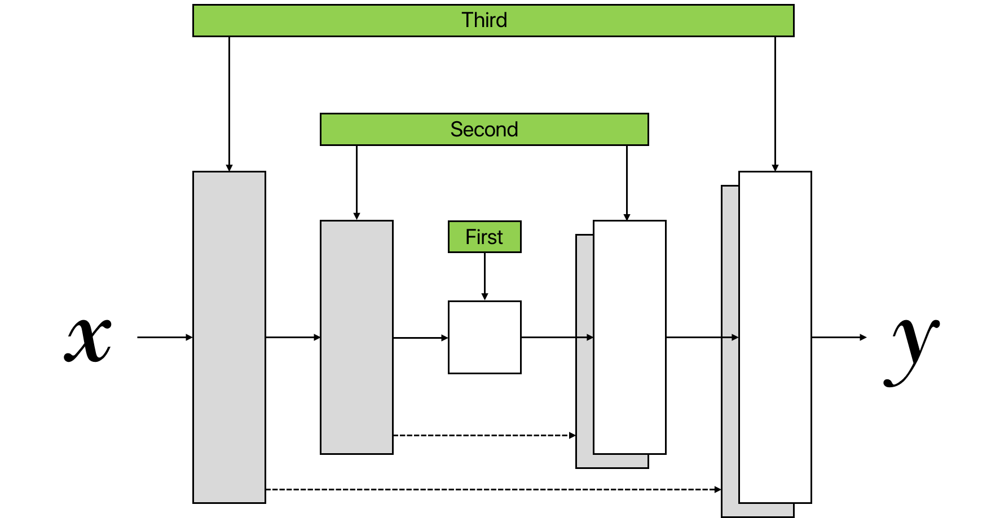
<br><br>
The green rectangles show the order in which the related modules are built with the code. The U-Net we will build has more layers than what is depicted in this image but it suffices to give you the idea. Also notice in the code that we are going 8 layers down, so if we start with a 256 by 256 image, in the middle of the U-Net we will get a 1 by 1 (256 / 2⁸) image and then it gets up-sampled to produce a 256 by 256 image (with two channels). This code snippet is really exciting and I highly recommend to play with it to fully grasp what every line of it is doing.

### 1.4 - Discriminator

We are using a **“Patch”** Discriminator here. In a vanilla discriminator, the model outputs one number (a scaler) which represents how much the model thinks the input (which is the whole image) is real (or fake). In a patch discriminator, the model outputs one number for every patch of say 70 by 70 pixels of the input image and for each of them decides whether it is fake or not separately. Using such a model for the task of colorization seems reasonable to me because the local changes that the model needs to make are really important and maybe deciding on the whole image as in vanilla discriminator cannot take care of the subtleties of this task. Here, the model’s output shape is 30 by 30 but it does not mean that our patches are 30 by 30. The actual patch size is obtained when you compute the receptive field of each of these 900 (30 multiplied by 30) output numbers which in our case will be 70 by 70.

In [ ]:
class PatchDiscriminator(nn.Module):
    def __init__(self, input_c, num_filters=64, n_down=3):
        super().__init__()
        model = [self.get_layers(input_c, num_filters, norm=False)]
        model += [self.get_layers(num_filters * 2 ** i, num_filters * 2 ** (i + 1), s=1 if i == (n_down-1) else 2) 
                          for i in range(n_down)] # the 'if' statement is taking care of not using
                                                  # stride of 2 for the last block in this loop
        model += [self.get_layers(num_filters * 2 ** n_down, 1, s=1, norm=False, act=False)] # Make sure to not use normalization or
                                                                                             # activation for the last layer of the model
        self.model = nn.Sequential(*model)                                                   
        
    def get_layers(self, ni, nf, k=4, s=2, p=1, norm=True, act=True): # when needing to make some repeatitive blocks of layers,
        layers = [nn.Conv2d(ni, nf, k, s, p, bias=not norm)]          # it's always helpful to make a separate method for that purpose
        if norm: layers += [nn.BatchNorm2d(nf)]
        if act: layers += [nn.LeakyReLU(0.2, True)]
        return nn.Sequential(*layers)
    
    def forward(self, x):
        return self.model(x)

Let's have a look at it's blocks

In [ ]:
print(PatchDiscriminator(input_c=3))

PatchDiscriminator(
  (model): Sequential(
    (0): Sequential(
      (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (1): LeakyReLU(negative_slope=0.2, inplace=True)
    )
    (1): Sequential(
      (0): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2, inplace=True)
    )
    (2): Sequential(
      (0): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2, inplace=True)
    )
    (3): Sequential(
      (0): Conv2d(256, 512, kernel_size=(4, 4), stride=(1, 1), padding=(1, 1), bias=False)
      (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2, inplace=True)
    )
    (

And the shape of it's output

In [ ]:
discriminator = PatchDiscriminator(3)
dummy_input = torch.randn(16, 3, 256, 256) # batch_size, channels, size, size
out = discriminator(dummy_input)
out.shape

torch.Size([16, 1, 30, 30])

### 1.5 - GANs Loss

#### A Deeper Dive into the Network
Let's take a look at the math. Consider ***x*** as the greyscale image, ***z*** as input noise for generator and ***y*** as the 2 channel output we want from the generator (The a* and b* color channels). Also, **G** is the generator model and **D** is the discriminator. Then the total loss for our GAN will be:
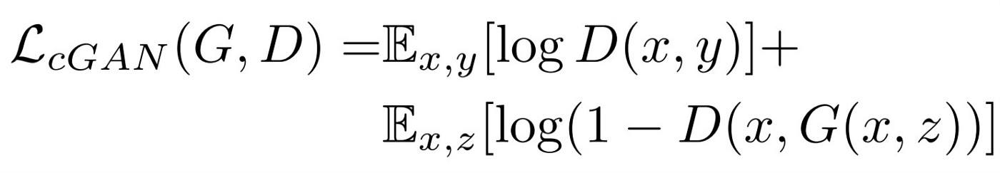
<br><br>
Notice that ***x*** is given to both models which is the condition we introduce two both players of this game. Actually, we are not going to feed a “n” dimensional vector of random noise to the generator as you might expect but the noise is introduced in the form of dropout layers in the generator architecture.

#### Optimising the Loss Function
The earlier loss function helps to produce good-looking colorful images that seem real, but to further help the models and introduce some supervision in our task, we combine this loss function with mean absolute error of the predicted colors compared with the actual colors:
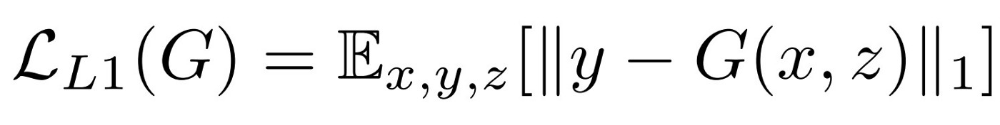
<br><br>
If we use mean absolute error loss, or L1 loss alone, the model still learns to colorize the images but it will be conservative and most of the time uses colors like “gray” or “brown” because when it doubts which color is the best, it takes the average and uses these colors to reduce the L1 loss as much as possible. Also, the L1 Loss is preferred over L2 loss (or mean squared error) because it reduces that effect of producing gray-ish images. So, our combined loss function will be:
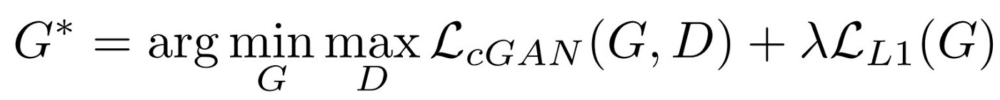
<br><br>
where ***λ*** is a coefficient to balance the contribution of the two losses to the final loss (of course the discriminator loss does not involve the L1 loss).

In [ ]:
class GANLoss(nn.Module):
    def __init__(self, gan_mode='vanilla', real_label=1.0, fake_label=0.0):
        super().__init__()
        self.register_buffer('real_label', torch.tensor(real_label))
        self.register_buffer('fake_label', torch.tensor(fake_label))
        if gan_mode == 'vanilla':
            self.loss = nn.BCEWithLogitsLoss()
        elif gan_mode == 'lsgan':
            self.loss = nn.MSELoss()
    
    def get_labels(self, preds, target_is_real):
        if target_is_real:
            labels = self.real_label
        else:
            labels = self.fake_label
        return labels.expand_as(preds)
    
    def __call__(self, preds, target_is_real):
        labels = self.get_labels(preds, target_is_real)
        loss = self.loss(preds, labels)
        return loss

This is a handy class we can use to calculate the GAN loss of our final model. In the **_ _ init _ _** we decide which kind of loss we’re going to use (which will be “vanilla” in our project) and register some constant tensors as the “real” and “fake” labels. Then when we call this module, it makes an appropriate tensor full of zeros or ones (according to what we need at the stage) and computes the loss.

### 1.X - Model Initialization

Here is our logic to initialize our models. We are going to initialize the weights of our model with a mean of 0.0 and standard deviation of 0.02 which are the proposed hyperparameters in the papers:

In [ ]:
def init_weights(net, init='norm', gain=0.02):
    
    def init_func(m):
        classname = m.__class__.__name__
        if hasattr(m, 'weight') and 'Conv' in classname:
            if init == 'norm':
                nn.init.normal_(m.weight.data, mean=0.0, std=gain)
            elif init == 'xavier':
                nn.init.xavier_normal_(m.weight.data, gain=gain)
            elif init == 'kaiming':
                nn.init.kaiming_normal_(m.weight.data, a=0, mode='fan_in')
            
            if hasattr(m, 'bias') and m.bias is not None:
                nn.init.constant_(m.bias.data, 0.0)
        elif 'BatchNorm2d' in classname:
            nn.init.normal_(m.weight.data, 1., gain)
            nn.init.constant_(m.bias.data, 0.)
            
    net.apply(init_func)
    print(f"model initialized with {init} initialization")
    return net

def init_model(model, device):
    model = model.to(device)
    model = init_weights(model)
    return model

### 1.6 - Putting everything until now together

In [ ]:
class MainModel(nn.Module):
    def __init__(self, net_G=None, lr_G=2e-4, lr_D=2e-4, 
                 beta1=0.5, beta2=0.999, lambda_L1=100.):
        super().__init__()
        
        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        self.lambda_L1 = lambda_L1
        
        if net_G is None:
            self.net_G = init_model(Unet(input_c=1, output_c=2, n_down=8, num_filters=64), self.device)
        else:
            self.net_G = net_G.to(self.device)
        self.net_D = init_model(PatchDiscriminator(input_c=3, n_down=3, num_filters=64), self.device)
        self.GANcriterion = GANLoss(gan_mode='vanilla').to(self.device)
        self.L1criterion = nn.L1Loss()
        self.opt_G = optim.Adam(self.net_G.parameters(), lr=lr_G, betas=(beta1, beta2))
        self.opt_D = optim.Adam(self.net_D.parameters(), lr=lr_D, betas=(beta1, beta2))
    
    def set_requires_grad(self, model, requires_grad=True):
        for p in model.parameters():
            p.requires_grad = requires_grad
        
    def setup_input(self, data):
        self.L = data['L'].to(self.device)
        self.ab = data['ab'].to(self.device)
        
    def forward(self):
        self.fake_color = self.net_G(self.L)
    
    def backward_D(self):
        fake_image = torch.cat([self.L, self.fake_color], dim=1)
        fake_preds = self.net_D(fake_image.detach())
        self.loss_D_fake = self.GANcriterion(fake_preds, False)
        real_image = torch.cat([self.L, self.ab], dim=1)
        real_preds = self.net_D(real_image)
        self.loss_D_real = self.GANcriterion(real_preds, True)
        self.loss_D = (self.loss_D_fake + self.loss_D_real) * 0.5
        self.loss_D.backward()
    
    def backward_G(self):
        fake_image = torch.cat([self.L, self.fake_color], dim=1)
        fake_preds = self.net_D(fake_image)
        self.loss_G_GAN = self.GANcriterion(fake_preds, True)
        self.loss_G_L1 = self.L1criterion(self.fake_color, self.ab) * self.lambda_L1
        self.loss_G = self.loss_G_GAN + self.loss_G_L1
        self.loss_G.backward()
    
    def optimize(self):
        self.forward()
        self.net_D.train()
        self.set_requires_grad(self.net_D, True)
        self.opt_D.zero_grad()
        self.backward_D()
        self.opt_D.step()
        
        self.net_G.train()
        self.set_requires_grad(self.net_D, False)
        self.opt_G.zero_grad()
        self.backward_G()
        self.opt_G.step()

model = MainModel()

model initialized with norm initialization
model initialized with norm initialization


### 1.XX - Utility Functions

These are just some functions to log the losses of our network so that we can visualise the results during our training.

In [ ]:
class AverageMeter:
    def __init__(self):
        self.reset()
        
    def reset(self):
        self.count, self.avg, self.sum = [0.] * 3
    
    def update(self, val, count=1):
        self.count += count
        self.sum += count * val
        self.avg = self.sum / self.count

def create_loss_meters():
    loss_D_fake = AverageMeter()
    loss_D_real = AverageMeter()
    loss_D = AverageMeter()
    loss_G_GAN = AverageMeter()
    loss_G_L1 = AverageMeter()
    loss_G = AverageMeter()
    
    return {'loss_D_fake': loss_D_fake,
            'loss_D_real': loss_D_real,
            'loss_D': loss_D,
            'loss_G_GAN': loss_G_GAN,
            'loss_G_L1': loss_G_L1,
            'loss_G': loss_G}

def update_losses(model, loss_meter_dict, count):
    for loss_name, loss_meter in loss_meter_dict.items():
        loss = getattr(model, loss_name)
        loss_meter.update(loss.item(), count=count)

def lab_to_rgb(L, ab):
    """
    Takes a batch of images
    """
    
    L = (L + 1.) * 50.
    ab = ab * 110.
    Lab = torch.cat([L, ab], dim=1).permute(0, 2, 3, 1).cpu().numpy()
    rgb_imgs = []
    for img in Lab:
        img_rgb = lab2rgb(img)
        rgb_imgs.append(img_rgb)
    return np.stack(rgb_imgs, axis=0)
    
def visualize(model, data, save=True):
    model.net_G.eval()
    with torch.no_grad():
        model.setup_input(data)
        model.forward()
    model.net_G.train()
    fake_color = model.fake_color.detach()
    real_color = model.ab
    L = model.L
    fake_imgs = lab_to_rgb(L, fake_color)
    real_imgs = lab_to_rgb(L, real_color)
    fig = plt.figure(figsize=(15, 8))
    for i in range(5):
        ax = plt.subplot(3, 5, i + 1)
        ax.imshow(L[i][0].cpu(), cmap='gray')
        ax.axis("off")
        ax = plt.subplot(3, 5, i + 1 + 5)
        ax.imshow(fake_imgs[i])
        ax.axis("off")
        ax = plt.subplot(3, 5, i + 1 + 10)
        ax.imshow(real_imgs[i])
        ax.axis("off")
    plt.show()
    if save:
        fig.savefig(f"colorization_{time.time()}.png")
        
def log_results(loss_meter_dict):
    for loss_name, loss_meter in loss_meter_dict.items():
        print(f"{loss_name}: {loss_meter.avg:.5f}")

### 1.7 - Training Function

I hope this code is self-explanatory. Every epoch takes about 3 minutes on not a powerful GPU such as the Nvidia RTX3080 on my device. However, we're using Google Colab for this particular notebook so the allocated resources are supposed to be faster.

In [ ]:
def train_model(model, train_dl, epochs, display_every=200):
    data = next(iter(val_dl)) # getting a batch for visualizing the model output after fixed intrvals
    for e in range(epochs):
        loss_meter_dict = create_loss_meters() # function returing a dictionary of objects to 
        i = 0                                  # log the losses of the complete network
        for data in tqdm(train_dl):
            model.setup_input(data) 
            model.optimize()
            update_losses(model, loss_meter_dict, count=data['L'].size(0)) # function updating the log objects
            i += 1
            if i % display_every == 0:
                print(f"\nEpoch {e+1}/{epochs}")
                print(f"Iteration {i}/{len(train_dl)}")
                log_results(loss_meter_dict) # function to print out the losses
                visualize(model, data, save=False) # function displaying the model's outputs

### 1.8 - The Training

In [ ]:
train_model(model, train_dl, 100)

### 1.9 - Outputs after 20 Epochs

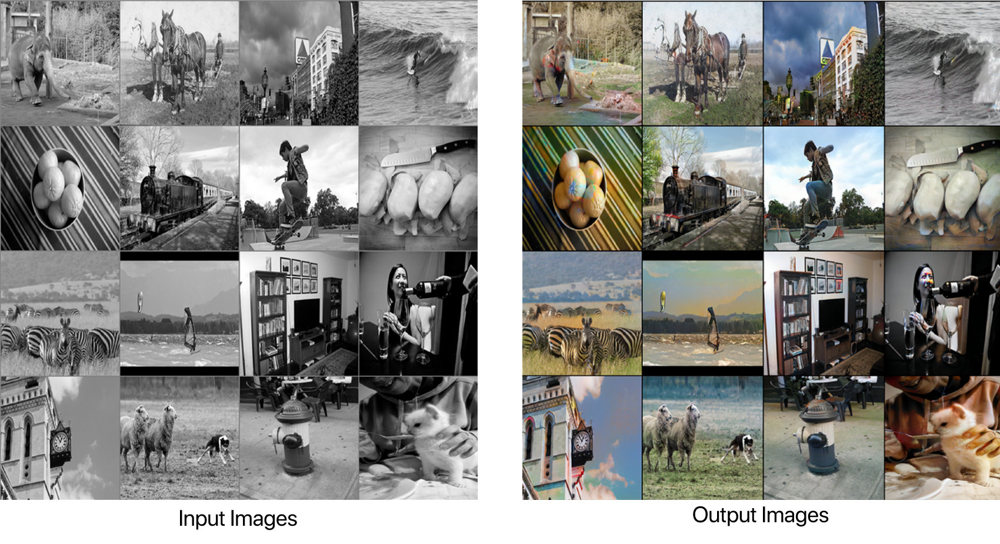

## X - Closing Statements for v3
As you can see, the model was easily able to identify the patterns and fill in the right colors in the right places. We can see some odd balls which didn't get a perfectly colored output but the probablity of these images turning out perfect is ~0.9 by the end of the training which is more than acceptable at this point.
<br><br>
This model will now be processed into an object on Jupyter Notebook (since Google Colab notebooks cannot run over 12 hours and the training for the final model will take a little over 2 weeks) which can be used in scripts for the complete project.
<br><br>
We'll be saving the model and rewriting it every Epoch for the convinience of being able to stop the training every few hours.



## 2 - An Alternate Approach
This section of the project was inspired from:<br>
[Photo-Realistic Single Image Super-Resolution Using a Generative Adversarial Network](https://arxiv.org/abs/1609.04802)<br>
The idea is actually really simple. In the GAN setting that we used, neither of the agents (the generator or the discriminator) had any training about the task they will have to do, but here we decide to *pre-train* the generator for it's task to avoid the situation which the above mentioned research paper cites as **"Blind leading Blind"**
<br><br>
The pre-training will have two stages:

1.   Using a pretrained classification model for the down sampling path of the Generator (ResNet18)
2.   Pretraining the Generator for colorization with L1 loss (mean absolute error loss)



### 2.1 - Using the New Generator
Building a U-Net with a ResNet backbone sounds extremely hard and impressive but the proposed paper showed us that it really is not. Just use **fastai** using *pip* or *conda* and you're all good to go.
<br><br>
Here, the ***create_body*** function loads the pre-trained weights of ResNet18 architecture and cuts the model to remove the last two layers. Then, ***DynamicUnet*** uses this backbone to build a U-Net with an input size of 256 and a two-channel output, exactly as per our needs.

In [ ]:
# getting the right version of fastai
! pip install fastai==2.4

In [ ]:
from fastai.vision.learner import create_body
from torchvision.models.resnet import resnet18
from fastai.vision.models.unet import DynamicUnet


def build_res_unet(n_input=1, n_output=2, size=256):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    body = create_body(resnet18, pretrained=True, n_in=n_input, cut=-2)
    net_G = DynamicUnet(body, n_output, (size, size)).to(device)
    return net_G

### 2.2 - Pretraining the Generator for Colorization
This is a pretty self-explainatory code here. We just pre-train the generator for 20 epochs and save the model. This doesn't take too much time so it should be done in a little under a couple of hours on any decent GPU like the Nvidia GTX1650 or higher.

In [ ]:

def pretrain_generator(net_G, train_dl, opt, criterion, epochs):
    for e in range(epochs):
        loss_meter = AverageMeter()
        for data in tqdm(train_dl):
            L, ab = data['L'].to(device), data['ab'].to(device)
            preds = net_G(L)
            loss = criterion(preds, ab)
            opt.zero_grad()
            loss.backward()
            opt.step()
            
            loss_meter.update(loss.item(), L.size(0))
            
        print(f"Epoch {e + 1}/{epochs}")
        print(f"L1 Loss: {loss_meter.avg:.5f}")

net_G = build_res_unet(n_input=1, n_output=2, size=256)
opt = optim.Adam(net_G.parameters(), lr=1e-4)
criterion = nn.L1Loss()        
pretrain_generator(net_G, train_dl, opt, criterion, 20)
torch.save(net_G.state_dict(), "res18-unet.pt")


/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


  0%|          | 0.00/44.7M [00:00<?, ?B/s]

  0%|          | 0/500 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:560: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: UserWarning: Defining your `__torch_function__` as a plain method is deprecated and will be an error in future, please define it as a classmethod. (Triggered internally at  ../torch/csrc/utils/python_arg_parser.cpp:295.)
  del sys.path[0]


### 2.3 -  Putting everything together for the second time


In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
net_G = build_res_unet(n_input=1, n_output=2, size=256)
net_G.load_state_dict(torch.load("res18-unet.pt", map_location=device))
model = MainModel(net_G=net_G)

### 2.4 - The Training

In [ ]:
train_model(model, train_dl, 10)

### 2.5 - Outputs after 20 Epochs

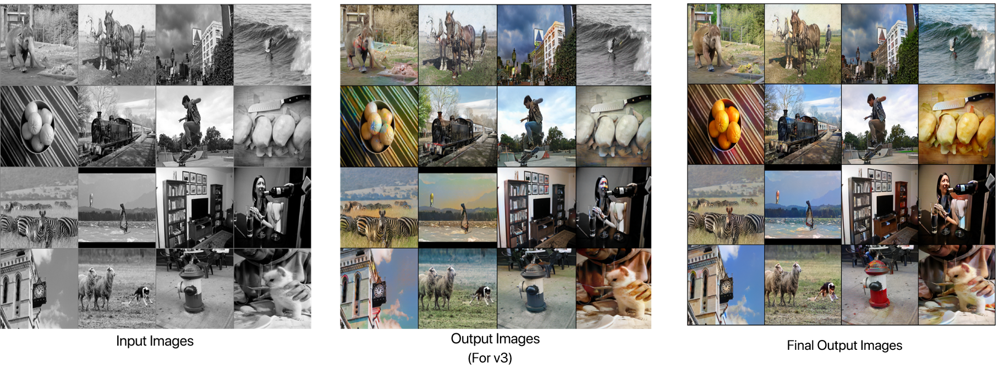

## XX - Closing remarks for v3.1
As you can see, some small changes were able to improve our results so much. By the end, our model was able to reach an accuracy of over 98% with the original images. We'll add comaprisons with famous models like **deOldify** to measure our levels of success. For your persual, (or wanting to use the model yourself) [here is a link](https://drive.google.com/file/d/1FiduCrsKd-8FiUSCLir4o0wPescZaqPe/view?usp=sharing) to the pretrained weights for our model that we trained during our session.


## Comparison with DeOldify
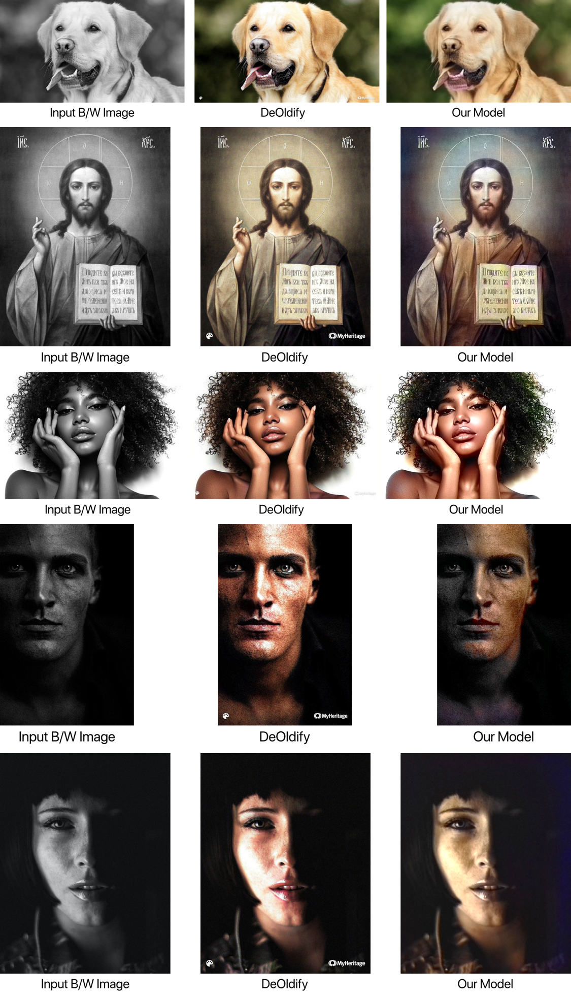